# Проект для «МиФаСоль»

Сервис расширяет работу с новыми артистами и музыкантами, в связи с чем возникла задача -- правильно классифицировать новые музыкальные треки, чтобы улучшить работу рекомендательной системы.

Разработаем модель, позволяющую классифицировать музыкальные произведения по жанрам.

## Описание данных

- train.csv - информация (~20000) музыкальных треках, которые будут использоваться в качестве обучающих данных.
- test.csv - информация (~5000) музыкальных треках, которые будут использоваться в качестве тестовых данных. Ваша задача - предсказать значение 'music_genre' для каждого трека из этого датасета.
- sample_submit.csv - файл предсказаний в правильном формате.


- instance_id - идентификатор трека в тестовом наборе.
- music_genre - Целевой признак. Для каждого трека предскажите категориальное значение соответствующее музыкальному жанру трека.

# Критерии, которые важны заказчику:

- итоговый сабмит из двух столбцов (`instance_id ` и `music_genre`)
- качество предсказания (целевая метрика `F1-Score (micro)`).

Признаки:
- instance_id - уникальный идентификатор трека;
- track_name - название трека;
- acousticness - акустичность;
- danceability - танцевальность;
- duration_ms -продолжительность в милисекундах;
- energy - энергичность;
- instrumentalness - инструментальность;
- key - базовый ключ (нота) произведения;
- liveness - привлекательность;
- loudness - громкость;
- mode - указывает на модальность (мажорную или минорную) трека;
- speechiness - выразительность;
- tempo - темп;
- obtained_date - дата загрузки в сервис;
- valence - привлекательность произведения для пользователей сервиса.

Целевой признак:
- music_genre - музыкальный жанр

## План действий

- загрузка и ознакомление с данными;
- предварительная обработка;
- полноценный разведочный анализ;
- разработка новых синтетических признаков;
- проверка на мультиколлинеарность;
- отбор финального набора обучающих признаков;
- выбор и обучение моделей;
- итоговая оценка качества предсказания лучшей модели;
- анализ важности ее признаков.

<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Описание-данных" data-toc-modified-id="Описание-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Описание данных</a></span></li><li><span><a href="#План-действий" data-toc-modified-id="План-действий-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>План действий</a></span></li><li><span><a href="#Загрузка-и-ознакомление-с-данными" data-toc-modified-id="Загрузка-и-ознакомление-с-данными-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Загрузка и ознакомление с данными</a></span><ul class="toc-item"><li><span><a href="#Бибилиотеки" data-toc-modified-id="Бибилиотеки-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Бибилиотеки</a></span></li><li><span><a href="#Откроем-и-изучим-файлы" data-toc-modified-id="Откроем-и-изучим-файлы-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Откроем и изучим файлы</a></span><ul class="toc-item"><li><span><a href="#Общая-информация" data-toc-modified-id="Общая-информация-3.2.1"><span class="toc-item-num">3.2.1&nbsp;&nbsp;</span>Общая информация</a></span></li></ul></li><li><span><a href="#Вывод-по-итогу-EDA" data-toc-modified-id="Вывод-по-итогу-EDA-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Вывод по итогу EDA</a></span></li></ul></li><li><span><a href="#Предварительная-обработка" data-toc-modified-id="Предварительная-обработка-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Предварительная обработка</a></span><ul class="toc-item"><li><span><a href="#Удаление-столбцов" data-toc-modified-id="Удаление-столбцов-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Удаление столбцов</a></span></li><li><span><a href="#Обработка-пропусков" data-toc-modified-id="Обработка-пропусков-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Обработка пропусков</a></span></li><li><span><a href="#Обработка-выбросов" data-toc-modified-id="Обработка-выбросов-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Обработка выбросов</a></span></li></ul></li><li><span><a href="#Разработка-синтетических-признаков" data-toc-modified-id="Разработка-синтетических-признаков-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Разработка синтетических признаков</a></span><ul class="toc-item"><li><span><a href="#Лемматизация-и-очистка-текста" data-toc-modified-id="Лемматизация-и-очистка-текста-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Лемматизация и очистка текста</a></span></li><li><span><a href="#Разделим-выборки" data-toc-modified-id="Разделим-выборки-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Разделим выборки</a></span></li><li><span><a href="#Стоп-слова-и-векторизация-текста" data-toc-modified-id="Стоп-слова-и-векторизация-текста-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Стоп-слова и векторизация текста</a></span></li><li><span><a href="#Вывод-по-итогу-векторизации-текста:" data-toc-modified-id="Вывод-по-итогу-векторизации-текста:-5.4"><span class="toc-item-num">5.4&nbsp;&nbsp;</span>Вывод по итогу векторизации текста:</a></span></li><li><span><a href="#Кодирование-данных" data-toc-modified-id="Кодирование-данных-5.5"><span class="toc-item-num">5.5&nbsp;&nbsp;</span>Кодирование данных</a></span></li><li><span><a href="#Вывод-по-итогу-разработки-синтетических-признаков" data-toc-modified-id="Вывод-по-итогу-разработки-синтетических-признаков-5.6"><span class="toc-item-num">5.6&nbsp;&nbsp;</span>Вывод по итогу разработки синтетических признаков</a></span></li></ul></li><li><span><a href="#Проверка-на-мультиколлинеарность" data-toc-modified-id="Проверка-на-мультиколлинеарность-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Проверка на мультиколлинеарность</a></span><ul class="toc-item"><li><span><a href="#Вывод-по-итогу-проверки" data-toc-modified-id="Вывод-по-итогу-проверки-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Вывод по итогу проверки</a></span></li></ul></li><li><span><a href="#Отбор-финального-набора-обучающих-признаков" data-toc-modified-id="Отбор-финального-набора-обучающих-признаков-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Отбор финального набора обучающих признаков</a></span><ul class="toc-item"><li><span><a href="#Анализ-важности-признаков" data-toc-modified-id="Анализ-важности-признаков-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span>Анализ важности признаков</a></span></li><li><span><a href="#Вывод-по-итогу-отбора-финального-набора-обучающих-признаков" data-toc-modified-id="Вывод-по-итогу-отбора-финального-набора-обучающих-признаков-7.2"><span class="toc-item-num">7.2&nbsp;&nbsp;</span>Вывод по итогу отбора финального набора обучающих признаков</a></span></li></ul></li><li><span><a href="#Выбор-и-обучение-моделей" data-toc-modified-id="Выбор-и-обучение-моделей-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Выбор и обучение моделей</a></span><ul class="toc-item"><li><span><a href="#KNeighborsClassifier" data-toc-modified-id="KNeighborsClassifier-8.1"><span class="toc-item-num">8.1&nbsp;&nbsp;</span>KNeighborsClassifier</a></span></li><li><span><a href="#Случайный-лес" data-toc-modified-id="Случайный-лес-8.2"><span class="toc-item-num">8.2&nbsp;&nbsp;</span>Случайный лес</a></span></li><li><span><a href="#LightGBM" data-toc-modified-id="LightGBM-8.3"><span class="toc-item-num">8.3&nbsp;&nbsp;</span>LightGBM</a></span></li><li><span><a href="#CatBoost" data-toc-modified-id="CatBoost-8.4"><span class="toc-item-num">8.4&nbsp;&nbsp;</span>CatBoost</a></span></li><li><span><a href="#Support-vector-machine-(svc)" data-toc-modified-id="Support-vector-machine-(svc)-8.5"><span class="toc-item-num">8.5&nbsp;&nbsp;</span>Support vector machine (svc)</a></span></li><li><span><a href="#Тестирование-моделей" data-toc-modified-id="Тестирование-моделей-8.6"><span class="toc-item-num">8.6&nbsp;&nbsp;</span>Тестирование моделей</a></span><ul class="toc-item"><li><span><a href="#KNeighborsClassifier" data-toc-modified-id="KNeighborsClassifier-8.6.1"><span class="toc-item-num">8.6.1&nbsp;&nbsp;</span>KNeighborsClassifier</a></span></li><li><span><a href="#Случайный-лес" data-toc-modified-id="Случайный-лес-8.6.2"><span class="toc-item-num">8.6.2&nbsp;&nbsp;</span>Случайный лес</a></span></li><li><span><a href="#LightGBM" data-toc-modified-id="LightGBM-8.6.3"><span class="toc-item-num">8.6.3&nbsp;&nbsp;</span>LightGBM</a></span></li><li><span><a href="#CatBoost" data-toc-modified-id="CatBoost-8.6.4"><span class="toc-item-num">8.6.4&nbsp;&nbsp;</span>CatBoost</a></span></li><li><span><a href="#Support-vector-machine-(svc)" data-toc-modified-id="Support-vector-machine-(svc)-8.6.5"><span class="toc-item-num">8.6.5&nbsp;&nbsp;</span>Support vector machine (svc)</a></span></li><li><span><a href="#Голосование-по-большинству" data-toc-modified-id="Голосование-по-большинству-8.6.6"><span class="toc-item-num">8.6.6&nbsp;&nbsp;</span>Голосование по большинству</a></span></li></ul></li><li><span><a href="#Вывод-по-итогу-выбора-модели" data-toc-modified-id="Вывод-по-итогу-выбора-модели-8.7"><span class="toc-item-num">8.7&nbsp;&nbsp;</span>Вывод по итогу выбора модели</a></span></li></ul></li><li><span><a href="#Тестовые-данные" data-toc-modified-id="Тестовые-данные-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Тестовые данные</a></span><ul class="toc-item"><li><span><a href="#Подготовка-тестовых-данных" data-toc-modified-id="Подготовка-тестовых-данных-9.1"><span class="toc-item-num">9.1&nbsp;&nbsp;</span>Подготовка тестовых данных</a></span><ul class="toc-item"><li><span><a href="#Обработка-пропусков" data-toc-modified-id="Обработка-пропусков-9.1.1"><span class="toc-item-num">9.1.1&nbsp;&nbsp;</span>Обработка пропусков</a></span></li><li><span><a href="#Разработка-синтетических-признаков" data-toc-modified-id="Разработка-синтетических-признаков-9.1.2"><span class="toc-item-num">9.1.2&nbsp;&nbsp;</span>Разработка синтетических признаков</a></span></li><li><span><a href="#Кодирование-данных" data-toc-modified-id="Кодирование-данных-9.1.3"><span class="toc-item-num">9.1.3&nbsp;&nbsp;</span>Кодирование данных</a></span></li></ul></li><li><span><a href="#Предсказание-модели" data-toc-modified-id="Предсказание-модели-9.2"><span class="toc-item-num">9.2&nbsp;&nbsp;</span>Предсказание модели</a></span><ul class="toc-item"><li><span><a href="#Декодирование-результата" data-toc-modified-id="Декодирование-результата-9.2.1"><span class="toc-item-num">9.2.1&nbsp;&nbsp;</span>Декодирование результата</a></span></li></ul></li><li><span><a href="#Формирование-сабмита" data-toc-modified-id="Формирование-сабмита-9.3"><span class="toc-item-num">9.3&nbsp;&nbsp;</span>Формирование сабмита</a></span></li></ul></li><li><span><a href="#Итоговый-вывод" data-toc-modified-id="Итоговый-вывод-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>Итоговый вывод</a></span><ul class="toc-item"><li><span><a href="#Возможные-улучшения" data-toc-modified-id="Возможные-улучшения-10.1"><span class="toc-item-num">10.1&nbsp;&nbsp;</span>Возможные улучшения</a></span></li></ul></li></ul></div>

## Загрузка и ознакомление с данными

### Бибилиотеки

In [1]:
# подготавливаем рабочее пространство
# загружаем библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns
import scipy.sparse
import itertools

In [2]:
from ydata_profiling import ProfileReport

import phik
from phik import resources, report
import shap

In [3]:
import nltk
from nltk.corpus import stopwords as nltk_stopwords, wordnet
from sklearn.feature_extraction.text import TfidfVectorizer
import re
import torch
import transformers
from tqdm import notebook
from pymystem3 import Mystem
from nltk.stem import WordNetLemmatizer
from tqdm import tqdm

In [4]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV #, cross_val_score

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

from sklearn.metrics import f1_score #, accuracy_score
from sklearn.metrics import classification_report

import lightgbm as lgb
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

### Откроем и изучим файлы

#### Общая информация

In [5]:
try:
    df = pd.read_csv('/datasets/kaggle_music_genre_train.csv')
except:
    df = pd.read_csv(r'kaggle_music_genre_train.csv')

In [6]:
pd.set_option('display.max_columns', None)

In [7]:
display(df.info())
display(df.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20394 entries, 0 to 20393
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       20394 non-null  float64
 1   track_name        20394 non-null  object 
 2   acousticness      20394 non-null  float64
 3   danceability      20394 non-null  float64
 4   duration_ms       20394 non-null  float64
 5   energy            20394 non-null  float64
 6   instrumentalness  20394 non-null  float64
 7   key               19659 non-null  object 
 8   liveness          20394 non-null  float64
 9   loudness          20394 non-null  float64
 10  mode              19888 non-null  object 
 11  speechiness       20394 non-null  float64
 12  tempo             19952 non-null  float64
 13  obtained_date     20394 non-null  object 
 14  valence           20394 non-null  float64
 15  music_genre       20394 non-null  object 
dtypes: float64(11), object(5)
memory usage: 

None

,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,25143.0,Highwayman,0.4800,0.670,182653.0,0.351,0.017600,D,0.115,-16.842,Major,0.0463,101.384,4-Apr,0.450,Country
1,26091.0,Toes Across The Floor,0.2430,0.452,187133.0,0.670,0.000051,A,0.108,-8.392,Minor,0.0352,113.071,4-Apr,0.539,Rock
2,87888.0,First Person on Earth,0.2280,0.454,173448.0,0.804,0.000000,E,0.181,-5.225,Minor,0.3710,80.980,4-Apr,0.344,Alternative
3,77021.0,No Te Veo - Digital Single,0.0558,0.847,255987.0,0.873,0.000003,G#,0.325,-4.805,Minor,0.0804,116.007,4-Apr,0.966,Hip-Hop
4,20852.0,Chasing Shadows,0.2270,0.742,195333.0,0.575,0.000002,C,0.176,-5.550,Major,0.0487,76.494,4-Apr,0.583,Alternative


In [8]:
RANDOM_STATE = 42

In [12]:
# df = df.sample(1000, random_state=RANDOM_STATE).reset_index(drop=True) # объекты для отладки.

In [9]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

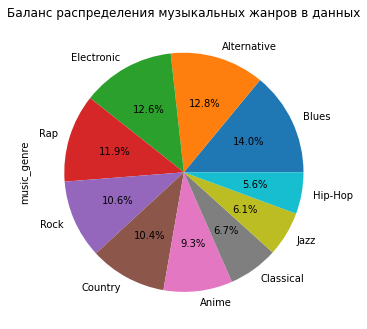

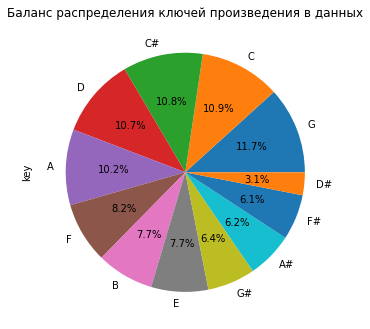

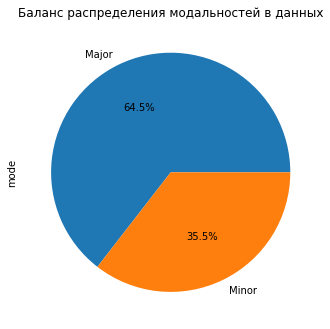

In [10]:
# Проверим распределение в столбцах с категориальными переменными
df['music_genre'].value_counts(normalize=True).plot(kind='pie',figsize=[5.5,5.5],
                                                legend=False, autopct='%1.1f%%')
plt.title('Баланс распределения музыкальных жанров в данных')
plt.show()


df['key'].value_counts(normalize=True).plot(kind='pie',figsize=[5.5,5.5],
                                                legend=False, autopct='%1.1f%%')
plt.title('Баланс распределения ключей произведения в данных')
plt.show()


df['mode'].value_counts(normalize=True).plot(kind='pie',figsize=[5.5,5.5],
                                                legend=False, autopct='%1.1f%%')
plt.title('Баланс распределения модальностей в данных')
plt.show()

In [11]:
round(df.isna().sum() / len(df) * 100, 2)

instance_id         0.00
track_name          0.00
acousticness        0.00
danceability        0.00
duration_ms         0.00
energy              0.00
instrumentalness    0.00
key                 3.60
liveness            0.00
loudness            0.00
mode                2.48
speechiness         0.00
tempo               2.17
obtained_date       0.00
valence             0.00
music_genre         0.00
dtype: float64

In [12]:
df.duplicated().sum()

0

### Вывод по итогу EDA

- Пропуски в столбцах `key`, `mode`, `tempo`
- Явные дубликаты отсутсвуют
- Неинформативные столбцы: `instance_id`, `obtained_date`, `key`
- Сильно коррелируемые стобцы: `acousticness`, `energy`, `loudness`
- Выбросы в столбцах: `duration_ms`, `instrumentalness`, `speechiness`


- Сильный дисбаланс классов отсутствует
- Из столбца `track_name` создадим синтетические признаки
- Необходимо кодирование признаков `key`, `mode`, а также, кодирование целевого признака `music_genre` с его последующим декодированием
- Необходима стандартизация данных

## Предварительная обработка

### Удаление столбцов

Рассмотрим сильно коррелируемые стобцы

Изучим корреляцию целевого признака `music_genre` со столбцами `instrumentalness`, `energy`, `loudness`

Согласно ProfileReport:
- `acousticness`сильно коррелирует с `energy`
- `loudness` сильно коррелирует `acousticness`
- `loudness` сильно коррелирует `energy`

Удаление из этой цепочки `energy` будет считаться регуляризацией.

In [13]:
df_clear = df.drop(['instance_id', 'obtained_date'], axis=1) #, 'acousticness', 'loudness', 'energy', 'key'

### Обработка пропусков

Пропуски в столбцах `key`, `mode`, `tempo` распределены равномерно по данным и скорее не зависят друг от друга. Корректно заполнить их мы не можем, а их небольшое количество позволит нам заполнить пропуски заглушками.

In [14]:
shape_before = df_clear.shape
shape_before

(20394, 14)

In [15]:
df_miss_values = df_clear.dropna(subset=['mode', 'tempo', 'key'])

In [16]:
shape_after_miss_values = df_miss_values.shape
shape_difference_miss_values = shape_after_miss_values[0] / shape_before[0] * 100
print(f'Процент данных, оставшихся после удаления: {round(shape_difference_miss_values, 3)}')
print(f'Суммарный процент пропусков по столбцам: {100 - sum(round(df.isna().sum() / len(df) * 100, 3))}')

Процент данных, оставшихся после удаления: 91.958
Суммарный процент пропусков по столбцам: 91.748


Видно, что преимущественная часть данных не пересекается и в целях сохранения, изучим, можно ли заполнить пропуски в категориальных данных константными переменными.

In [17]:
df_clear['key'] = df_clear['key'].fillna('unknown')

In [18]:
df_clear['mode'] = df_clear['mode'].fillna('unknown')

Пропуски в столбце `tempo` можно заменить средним значением, поскольку распределение признака по значениям нормальное.

In [19]:
df_clear['tempo'] = df_clear['tempo'].fillna(df_clear['tempo'].mean())

In [20]:
shape_after = df_clear.shape
shape_difference = shape_after[0] / shape_before[0] * 100
print(f'Процент данных, оставшихся после удаления: {round(shape_difference, 3)}')

Процент данных, оставшихся после удаления: 100.0


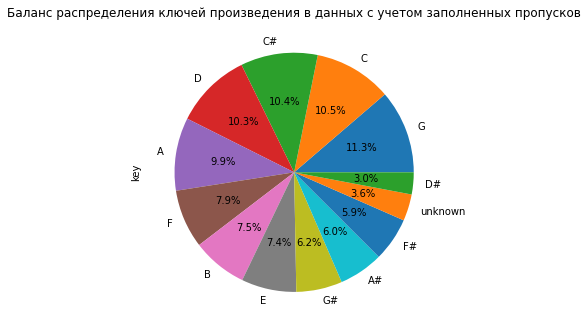

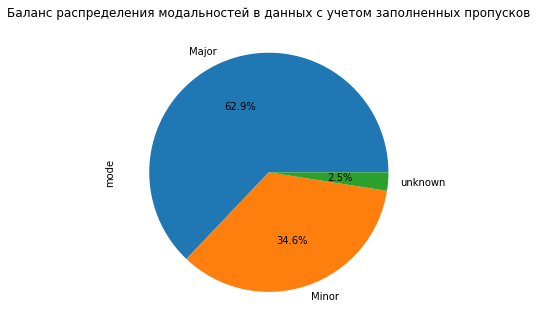

In [21]:
df_clear['key'].value_counts(normalize=True).plot(kind='pie',figsize=[5.5,5.5],
                                                legend=False, autopct='%1.1f%%')
plt.title('Баланс распределения ключей произведения в данных с учетом заполненных пропусков')
plt.show()


df_clear['mode'].value_counts(normalize=True).plot(kind='pie',figsize=[5.5,5.5],
                                                legend=False, autopct='%1.1f%%')
plt.title('Баланс распределения модальностей в данных с учетом заполненных пропусков')
plt.show()

### Обработка выбросов

array([[<AxesSubplot:title={'center':'duration_ms'}>,
        <AxesSubplot:title={'center':'instrumentalness'}>],
       [<AxesSubplot:title={'center':'speechiness'}>, <AxesSubplot:>]],
      dtype=object)

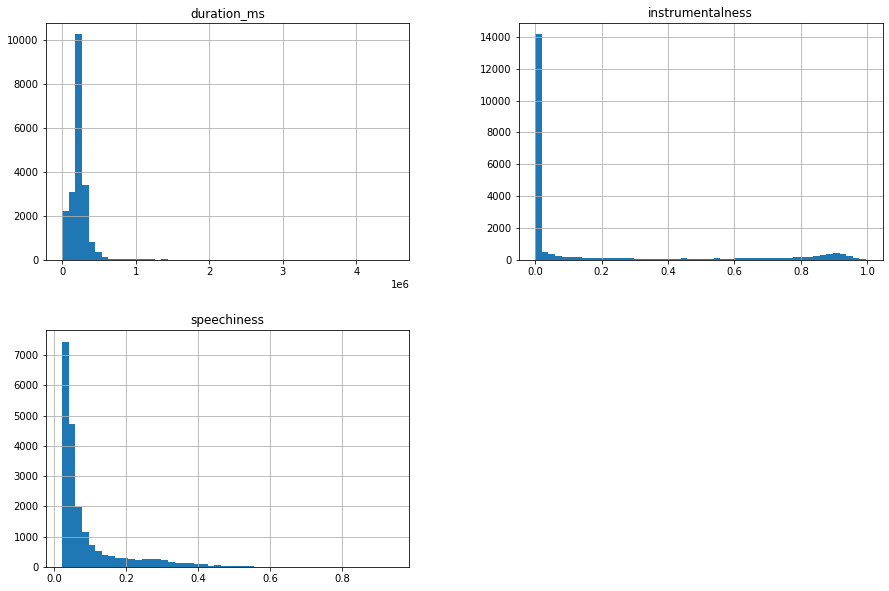

In [22]:
df_clear.hist(['duration_ms', 'instrumentalness', 'speechiness'], bins=50, figsize=(15, 10))

In [23]:
result = round(sum(df_clear['instrumentalness'] == 0) / df_clear.shape[0] * 100, 2)
print(f"Процент нулевых значений в столбце instrumentalness: {result}")

Процент нулевых значений в столбце instrumentalness: 29.31


In [24]:
df['duration_ms'].describe()

count    2.039400e+04
mean     2.203754e+05
std      1.267283e+05
min     -1.000000e+00
25%      1.775170e+05
50%      2.195330e+05
75%      2.660000e+05
max      4.497994e+06
Name: duration_ms, dtype: float64

In [25]:
result = round(sum(df_clear['duration_ms'] <= 0) / df_clear.shape[0] * 100, 2)
print(f"Процент отрицательных значений в столбце duration_ms: {result}")

Процент отрицательных значений в столбце duration_ms: 9.85


В столбце`speechiness` Пуассоновское распределение, проблем нет.

В столбце `instrumentalness` слишком большой показатель нулей, однако, корреляция между столбцами instrumentalness и music_genre, согласно ProfileReport равняется 0.205. Оставим данные значения без изменений, тк данные никак не заполнить, а удаление может привести к худшему результату.

В столбце `duration_ms` почти 10% данных равны `-1`. оставим произведения, длина коротых лежит в промежутке [30_000; 1_500_000] мс.

In [26]:
df_clear = df_clear.loc[(df_clear['duration_ms'] >= 30_000) &
                        (df_clear['duration_ms'] <= 1_500_000)]

In [27]:
df_clear.shape

(18373, 14)

## Разработка синтетических признаков

### Лемматизация и очистка текста

Проверим язык большинства песен

In [28]:
sorted(df_clear['track_name'].unique())

['"Concerto Funebre" con hautbois sordini e salmoè, violino principale e viole da gamba (Si Bem. Maggiore, RV 579): II. Allegro poco poco',
 '"DEVILS NEVER CRY"(スタッフロール)',
 '"Grande valse brillante" en Mi bémol majeur, Op. 18',
 '"Heroes" - 2017 Remastered Version',
 '"It’s A Good Day"',
 '"Nessun dorma!"',
 '"sometimes you meet the right people at the wrong times"',
 '"ラスボス"への道',
 '"脳"',
 '#1 Crush',
 '#15',
 '#19',
 '$20 Fine',
 '$50 Dollars and a Flask of Crown',
 '$TING',
 '$ave Dat Money (feat. Fetty Wap & Rich Homie Quan)',
 '& Down',
 "'68 aka Only Time",
 "'75 aka Stay With You",
 "'93 aka Don't Stop Me Now",
 "'I' Novel",
 "'Ode To Joy' From Symphony No. 9 In D Minor 'Choral', Op.125",
 "'Tain't What You Do (It's The Way That Cha Do It)",
 "'Til My Back Ain't Got No Bone",
 "'Til the City's On Fire",
 '(562) 453-9382 - Skit',
 '(Baby) Hold On',
 "(Don't Fear) The Reaper - Single Version",
 '(Exchange)',
 '(Get Your Kicks On) Route 66',
 '(Ghost) Riders In the Sky',
 '(I Got Th

Названия песен преимущественно на английском языке. Подготовим кормус для векторизации текста.

In [29]:
df_text = df_clear['track_name']

In [30]:
# Объявим корпус текстов, переведем его в тип юникод

corpus = list(df_text)
print(corpus[1])

Toes Across The Floor


In [31]:
# nltk.download('stopwords')
# nltk.download('averaged_perceptron_tagger')
# nltk.download('punkt')
# nltk.download('wordnet')
STOPWORDS = set(nltk_stopwords.words('english'))

In [32]:
# Объявим лемматизатор
wnl = WordNetLemmatizer()

In [33]:
# Функции для очистки и лемматизации текстов
def clear_text(text):
    y=re.sub(r"[^'a-zA-Z0-9]", ' ', text) 
    k=" ".join(y.split())
    return k


def get_wordnet_pos(word):
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)

def lemmafunction(textc):
    k=[]
    for i in nltk.word_tokenize(textc):
        y=wnl.lemmatize(i, get_wordnet_pos(i))
        k.append(y)
    return ' '.join(k)

In [34]:
%%time

corpus = df_text.apply(clear_text).apply(lemmafunction).str.lower()

Wall time: 52.2 s


In [35]:
# Объединим датасет и корпус:

df_corpus = pd.Series(corpus, index=df.index)
df_clear['track_name'] = df_corpus
df_clear.head(3)

,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre
0,highwayman,0.480,0.670,182653.0,0.351,0.017600,D,0.115,-16.842,Major,0.0463,101.384,0.450,Country
1,toes across the floor,0.243,0.452,187133.0,0.670,0.000051,A,0.108,-8.392,Minor,0.0352,113.071,0.539,Rock
2,first person on earth,0.228,0.454,173448.0,0.804,0.000000,E,0.181,-5.225,Minor,0.3710,80.980,0.344,Alternative


### Разделим выборки

Для дальнейшего использования подготовим тестовую выборку

In [36]:
X = df_clear.drop('music_genre', axis=1)
y = df_clear['music_genre']

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1,
                                                    random_state=RANDOM_STATE,
                                                    shuffle=True,
                                                    stratify=y)

In [38]:
train_sample = X_train.shape[0]/X.shape[0]
test_sample = X_test.shape[0]/X.shape[0]

print('Размер тренировочной выборки- {:.0%}'.format(train_sample))
print('Размер тестовой выборки - {:.0%}'.format(test_sample))

Размер тренировочной выборки- 90%
Размер тестовой выборки - 10%


### Стоп-слова и векторизация текста

In [39]:
X_train_vect = X_train['track_name']
X_test_vect = X_test['track_name']

In [40]:
# TFIDF-векторизатор
count_tf_idf = TfidfVectorizer(stop_words=STOPWORDS)

#Выполняю векторизацию текстов
X_train_vect = count_tf_idf.fit_transform(X_train_vect)
X_test_vect = count_tf_idf.transform(X_test_vect)

In [41]:
# Проверим размеры выборок
print(f"Размер тренировочной выборки до веторизации: {X_train.shape}")
print(f"Размер тренировочной выборки текста после векторизации: {X_train_vect.shape}")
print(f"Размер тестовой выборки до веторизации: {X_test.shape}")
print(f"Размер тестовой выборки текста после векторизации: {X_test_vect.shape}")
print()
print(f"Размер тренировочной выборки таргета до веторизации: {y_train.shape}")
print(f"Размер тестовой выборки таргета до веторизации: {y_test.shape}")

Размер тренировочной выборки до веторизации: (16535, 13)
Размер тренировочной выборки текста после векторизации: (16535, 11180)
Размер тестовой выборки до веторизации: (1838, 13)
Размер тестовой выборки текста после векторизации: (1838, 11180)

Размер тренировочной выборки таргета до веторизации: (16535,)
Размер тестовой выборки таргета до веторизации: (1838,)


In [42]:
X_train = X_train.drop('track_name', axis=1)
X_test = X_test.drop('track_name', axis=1)

In [43]:
c_train = X_train_vect.tocoo()
data_train_vect = pd.DataFrame({'node1': c_train.row,
                          'node2': c_train.col,
                          'edge_weight': c_train.data}).pivot_table(index='node1')

In [44]:
c_test = X_test_vect.tocoo()
data_test_vect = pd.DataFrame({'node1': c_test.row,
                          'node2': c_test.col,
                          'edge_weight': c_test.data}).pivot_table(index='node1')

In [45]:
X_train = pd.concat([X_train.reset_index(drop=True), data_train_vect], axis=1)
X_test = pd.concat([X_test.reset_index(drop=True), data_test_vect], axis=1)

In [46]:
X_test.head(3)

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,edge_weight,node2
0,0.4260,0.906,260080.0,0.731,0.000004,F#,0.0853,-7.021,Minor,0.0986,106.995,0.794,0.651543,2699.500000
1,0.0629,0.645,218027.0,0.956,0.001300,A#,0.3260,-3.426,Minor,0.0488,126.855,0.842,0.576699,7493.333333
2,0.1660,0.751,320584.0,0.731,0.386000,A,0.0743,-4.896,Minor,0.0387,136.978,0.266,0.658675,6149.000000


In [47]:
result_train = round(X_train['node2'].isna().sum() / len(X_train['node2']) * 100, 2)
result_test = round(X_test['node2'].isna().sum() / len(X_test['node2']) * 100, 2)
print(f"Процент нулевых значений в тренировочных данных по итогу векторизации текста: {result_train}")
print(f"Процент нулевых значений в тестовых данных по итогу векторизации текста: {result_test}")

Процент нулевых значений в тренировочных данных по итогу векторизации текста: 3.42
Процент нулевых значений в тестовых данных по итогу векторизации текста: 13.71


array([[<AxesSubplot:title={'center':'edge_weight'}>,
        <AxesSubplot:title={'center':'node2'}>]], dtype=object)

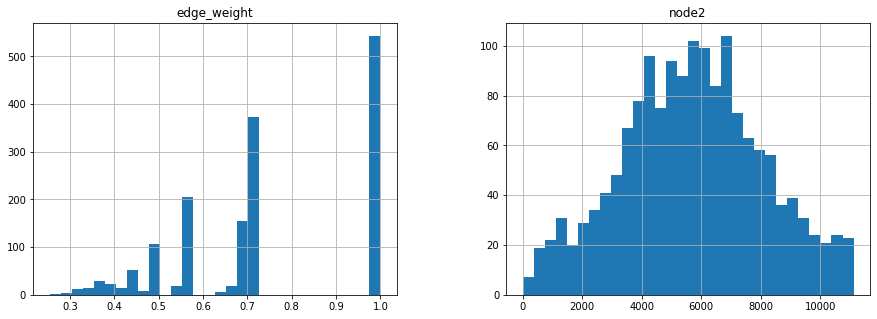

In [48]:
X_test.hist(['edge_weight', 'node2'], bins=30, figsize=(15, 5))

### Вывод по итогу векторизации текста:

Количество пропусков получилось значительным для тестовой выборки. Для искуственной тестовой выборки их можно удалить, как и для тренировочной, но результат формируется на других данных.

Поскольку для формирования сабмита нельзя будет удалять данные, необходимо оставить данные и заполнить пропуски константными значениями, например, средним по признаку. Также мы сохраним прочие значения для обучения

In [49]:
X_train['edge_weight'] = X_train['edge_weight'].fillna(X_train['edge_weight'].mean())
X_train['node2'] = X_train['node2'].fillna(X_test['node2'].mean())
X_test['edge_weight'] = X_test['edge_weight'].fillna(X_test['edge_weight'].mean())
X_test['node2'] = X_test['node2'].fillna(X_test['node2'].mean())

### Кодирование данных

Преобразуем признаки с использованием LabelEncoder, для сохранения большей коллинеарности признаков.

Поскольку данные в целевом столбце категориальные, используем OrdinalEncoder для него отдельно, чтобы была возможность проверки мультиколлинеарности и обучения модели CatBoost

Для библитотеки sklearn такое кодирование не обязательно, однако применим его для упрощения проверок корреляции и уменьшения повторных преобразований.

In [50]:
cat_cols = ['key','mode']

In [51]:
labelencoder_key = LabelEncoder()
labelencoder_mode = LabelEncoder()

In [52]:
X_train['key'] = pd.DataFrame(labelencoder_key.fit_transform(X_train['key']))
X_test['key'] = pd.DataFrame(labelencoder_key.transform(X_test['key']))

X_train['mode'] = pd.DataFrame(labelencoder_mode.fit_transform(X_train['mode']))
X_test['mode'] = pd.DataFrame(labelencoder_mode.transform(X_test['mode']))
X_train.head(2)

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,edge_weight,node2
0,0.262,0.809,224043.0,0.638,0.0,11,0.453,-5.646,1,0.2800,94.893,0.608,0.706653,7342.5
1,0.124,0.673,206027.0,0.900,0.0,7,0.284,-3.880,1,0.0866,108.466,0.633,0.705338,6228.0


###### Закодируем целевой признак

In [53]:
y_encoder = OrdinalEncoder()

In [65]:
# encoded_y_train.columns = y_encoder.get_feature_names_out()
# encoded_y_test.columns = y_encoder.get_feature_names_out()

In [54]:
y_train = pd.DataFrame(y_encoder.fit_transform(pd.DataFrame(y_train)[['music_genre']]), columns=['music_genre'])
y_test = pd.DataFrame(y_encoder.transform(pd.DataFrame(y_test)[['music_genre']]), columns=['music_genre'])

### Вывод по итогу разработки синтетических признаков

- Векторизированны названия произведений
- Категориальные переменные закодированы

## Проверка на мультиколлинеарность

Оценим корреляцию между признаками и выберем наиболее подходящие для обучения моделей.

In [55]:
corr_table = X_train.join(pd.DataFrame(y_train)).phik_matrix()

interval columns not set, guessing: ['acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'speechiness', 'tempo', 'valence', 'edge_weight', 'node2', 'music_genre']


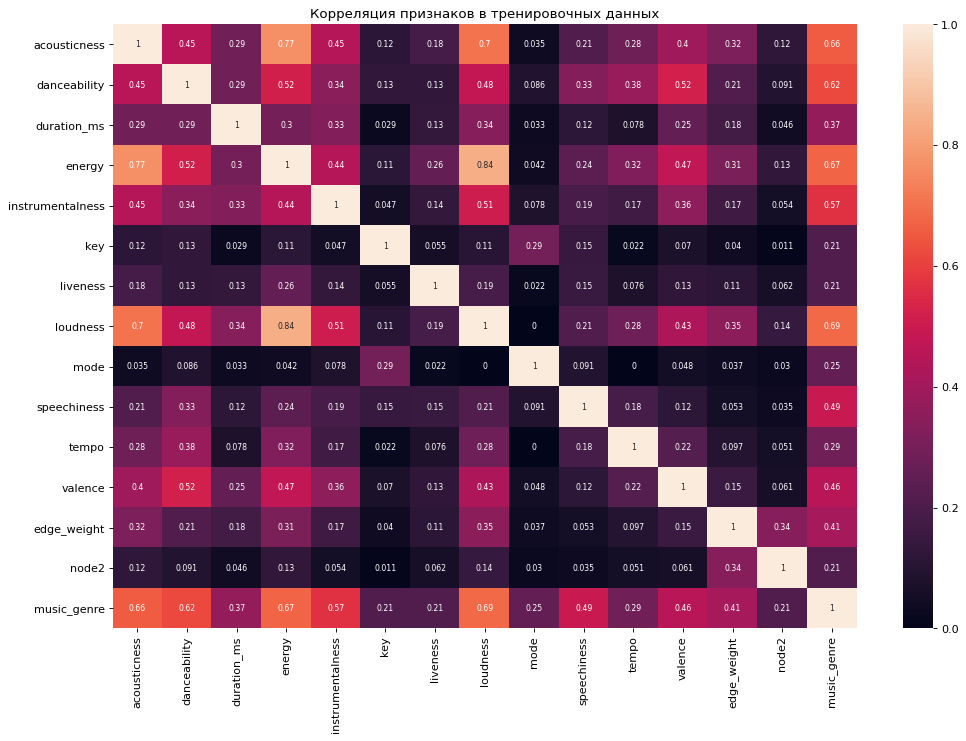

In [56]:
figure(figsize=(15, 10), dpi=80)
sns.heatmap(corr_table, annot=True, annot_kws={"size": 7})
plt.title('Корреляция признаков в тренировочных данных')
plt.show()

In [57]:
train_cols = X_train.columns
train_cols

Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'valence', 'edge_weight', 'node2'],
      dtype='object')

In [58]:
X_train = X_train[train_cols]
X_test = X_test[train_cols]

Выберем признаки для первого обучения моделей

In [59]:
# X_train = X_train.drop('energy', axis=1)
# X_test = X_test.drop('energy', axis=1)

In [60]:
# X_train = X_train.drop('node2', axis=1)
# X_test = X_test.drop('node2', axis=1)

In [61]:
# X_train = X_train.drop('acousticness', axis=1)
# X_test = X_test.drop('acousticness', axis=1)

### Вывод по итогу проверки

Столбец `x0_unknown` имеет почти нулею корреляцию с целевым признаком.  
Другие признаки, получившиеся из `key` имеют сильную корреляцию между собой, однако, их необъодимо оставить


Остальные признаки используем для обучения.

## Отбор финального набора обучающих признаков

Обучим модель LightGBM и отверем наиболее подходящие признаки для обучения других моделей

Обучение будем проводить с использованием pipeline

In [62]:
# Настраиваем pipeline
lgb_pipeline_train = make_pipeline(StandardScaler(),
                                    LGBMClassifier(random_state=RANDOM_STATE))

In [63]:
%%time

# Выберем параметры для grid search
lgb_parametrs_train = {
    'lgbmclassifier__learning_rate' : [0.01,],
    'lgbmclassifier__num_leaves' : range(10, 13, 3),
    'lgbmclassifier__n_estimators' : [1000],
    'lgbmclassifier__boosting_type' : ['goss']
}


# Настраиваем grid search
lgb_gs_train = GridSearchCV(lgb_pipeline_train, lgb_parametrs_train, n_jobs=-1, cv=5, scoring='f1_micro', verbose=10)

# Запускаем обучение X_train
lgb_gs_train.fit(X_train, y_train)


Fitting 5 folds for each of 1 candidates, totalling 5 fits


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Wall time: 28.4 s


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('lgbmclassifier',
                                        LGBMClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'lgbmclassifier__boosting_type': ['goss'],
                         'lgbmclassifier__learning_rate': [0.01],
                         'lgbmclassifier__n_estimators': [1000],
                         'lgbmclassifier__num_leaves': range(10, 13, 3)},
             scoring='f1_micro', verbose=10)

In [64]:
# Создадим dataframe из cross-validation данных
lgb_cv_scores_train = pd.DataFrame(lgb_gs_train.cv_results_).sort_values(by='rank_test_score')

# Отобразим полученные результаты
display(lgb_gs_train.best_params_)
lgb_cv_scores_train[['params','split0_test_score', 'split1_test_score', 'split2_test_score',\
       'split3_test_score', 'split4_test_score', 'mean_test_score',\
       'std_test_score', 'rank_test_score']].head()

{'lgbmclassifier__boosting_type': 'goss',
 'lgbmclassifier__learning_rate': 0.01,
 'lgbmclassifier__n_estimators': 1000,
 'lgbmclassifier__num_leaves': 10}

,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,"{'lgbmclassifier__boosting_type': 'goss', 'lgb...",0.476565,0.476565,0.497127,0.494406,0.487148,0.486362,0.008639,1


In [65]:
lgb_y_preds_train = lgb_gs_train.predict(X_test)
lgb_f1_train = f1_score(y_test, lgb_y_preds_train, average='micro')

print(f"Метрика F1 качества предсказания модели `LightGBM` равна: {lgb_f1_train}")

Метрика F1 качества предсказания модели `LightGBM` равна: 0.4613710554951034


### Анализ важности признаков

- Оценим важность признаков на примере LightGBM

In [66]:
# importances = np.zeros(len(X_train))
importances = lgb_gs_train.best_estimator_.steps[1][1].feature_importances_

In [67]:
def plot_feature_importance(feature_names, feature_scores, top_feats=20, title='Importance', x_label='Importance', 
                            y_label='Features'):
    tuples = [(name, round(score, 3)) for name, score in zip(feature_names, feature_scores)]
    tuples = sorted(tuples, key=lambda x: x[1])[-top_feats:]
    
    labels, values = zip(*tuples)
    _, ax = plt.subplots(1, 1, figsize=(10, 8))
    ylocs = np.arange(len(values))
    
    ax.barh(ylocs, values, align='center', height=0.4)
    for x, y in zip(values, ylocs):
        ax.text(x + 1, y, x, va='center')
        
    ax.set_yticks(ylocs)
    ax.set_yticklabels(labels)
    xlim = (0, max(values) * 1.1)
    ax.set_xlim(xlim)
    ylim = (-1, len(values))
    ax.set_ylim(ylim)
    
    ax.set_title(title)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.grid(True)

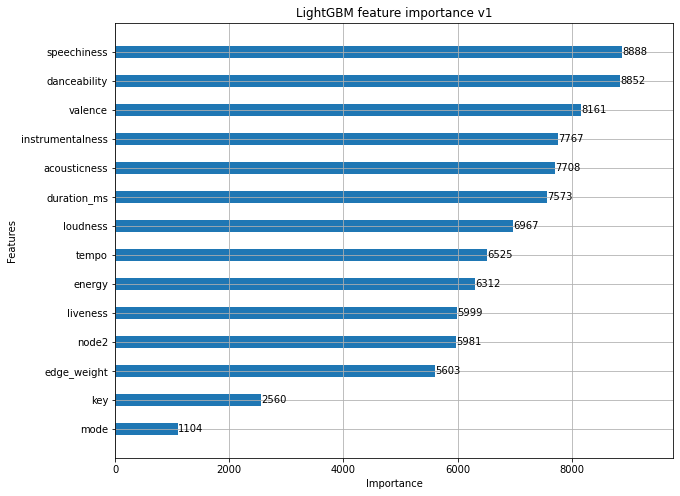

In [68]:
plot_feature_importance(X_train, importances, top_feats=20, title='LightGBM feature importance v1', 
                        x_label='Importance')

In [69]:
tuples = [(name, round(score, 3)) for name, score in zip(X_train, importances)]
tuples = sorted(tuples, key=lambda x: x[1])

top_selected_feats = [x[0] for x in tuples if x[1] >= np.median(importances)]

###### Обучим новую модель с учетом новых признаков

In [70]:
# Настраиваем pipeline
lgb_pipeline_train = make_pipeline(StandardScaler(),
                                    LGBMClassifier(random_state=RANDOM_STATE))

In [71]:
%%time

# Настраиваем grid search
lgb_gs_train_2 = GridSearchCV(lgb_pipeline_train, lgb_parametrs_train, n_jobs=-1, cv=5, scoring='f1_micro')

# Запускаем обучение X_train
lgb_gs_train_2.fit(X_train[top_selected_feats], y_train)


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Wall time: 25.5 s


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('lgbmclassifier',
                                        LGBMClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'lgbmclassifier__boosting_type': ['goss'],
                         'lgbmclassifier__learning_rate': [0.01],
                         'lgbmclassifier__n_estimators': [1000],
                         'lgbmclassifier__num_leaves': range(10, 13, 3)},
             scoring='f1_micro')

In [72]:
# Создадим dataframe из cross-validation данных
lgb_cv_scores_train_2 = pd.DataFrame(lgb_gs_train_2.cv_results_).sort_values(by='rank_test_score')

# Отобразим полученные результаты
# display(lgb_gs_train_1.best_params_)
lgb_cv_scores_train_2[['params','split0_test_score', 'split1_test_score', 'split2_test_score',\
       'split3_test_score', 'split4_test_score', 'mean_test_score',\
       'std_test_score', 'rank_test_score']].head()

,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,"{'lgbmclassifier__boosting_type': 'goss', 'lgb...",0.448745,0.461445,0.466586,0.467493,0.460538,0.460962,0.006693,1


In [73]:
importances_2 = lgb_gs_train_2.best_estimator_.steps[1][1].feature_importances_

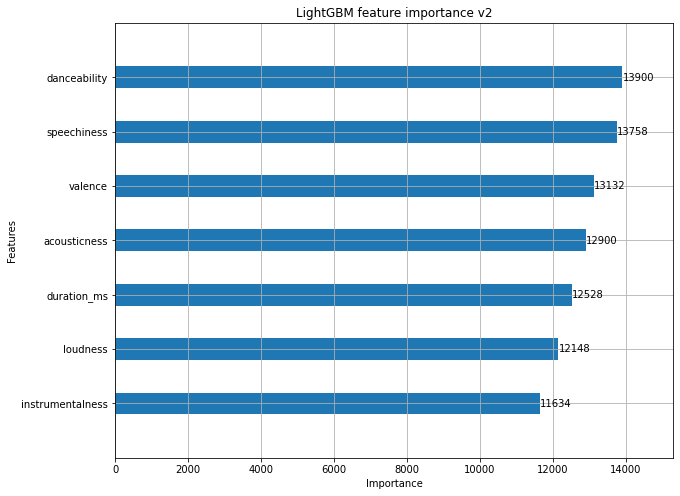

In [74]:
plot_feature_importance(X_train[top_selected_feats], importances_2, top_feats=20, title='LightGBM feature importance v2', 
                        x_label='Importance')

In [75]:
lgb_y_preds_train_2 = lgb_gs_train_2.predict(X_test[top_selected_feats])
lgb_f1_train_2 = f1_score(y_test, lgb_y_preds_train_2, average='micro')

print(f"Метрика F1 качества предсказания модели `LightGBM` равна: {lgb_f1_train_2}")

Метрика F1 качества предсказания модели `LightGBM` равна: 0.4581066376496192


### Вывод по итогу отбора финального набора обучающих признаков

В данных Важны почти все данные, их удаление не способствует улучшению модели. Оставим все признаки

In [80]:
top_selected_feats = X_train.columns

## Выбор и обучение моделей

In [85]:
models = []

### KNeighborsClassifier

In [86]:
# Настраиваем pipeline
knn_pipeline = make_pipeline(StandardScaler(),
#                                     SelectKBest(f_classif),
                                    KNeighborsClassifier())

In [87]:
# knn_pipeline.get_params().keys()

In [88]:
%%time

# Выберем параметры для grid search
knn_parametrs = {
    'kneighborsclassifier__n_neighbors' : range(50, 71, 3)
}

# Настраиваем grid search
knn_gs = GridSearchCV(knn_pipeline, knn_parametrs, n_jobs=-1, cv=5, scoring='f1_micro')

# Запускаем обучение X_train[top_selected_feats]
knn_gs.fit(X_train[top_selected_feats], y_train)


Wall time: 13.5 s


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('kneighborsclassifier',
                                        KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid={'kneighborsclassifier__n_neighbors': range(50, 71, 3)},
             scoring='f1_micro')

In [89]:
# Создадим dataframe из cross-validation данных
knn_cv_scores = pd.DataFrame(knn_gs.cv_results_).sort_values(by='rank_test_score')

# Отобразим полученные результаты
display(knn_gs.best_params_)
knn_cv_scores[['params','split0_test_score', 'split1_test_score', 'split2_test_score',\
       'split3_test_score', 'split4_test_score', 'mean_test_score',\
       'std_test_score', 'rank_test_score']].head()

{'kneighborsclassifier__n_neighbors': 68}

,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
6,{'kneighborsclassifier__n_neighbors': 68},0.404596,0.394617,0.406713,0.401572,0.412458,0.403992,0.005885,1
5,{'kneighborsclassifier__n_neighbors': 65},0.401572,0.394920,0.405806,0.399758,0.411249,0.402661,0.005535,2
4,{'kneighborsclassifier__n_neighbors': 62},0.401875,0.395222,0.407318,0.396129,0.407923,0.401693,0.005354,3
2,{'kneighborsclassifier__n_neighbors': 56},0.398851,0.390082,0.403084,0.396734,0.409435,0.399637,0.006453,4
3,{'kneighborsclassifier__n_neighbors': 59},0.399456,0.394013,0.402480,0.393106,0.409132,0.399637,0.005875,4


### Случайный лес

In [90]:
# Настраиваем pipeline
rfc_pipeline = make_pipeline(StandardScaler(),
#                                     SelectKBest(f_classif),
                                    RandomForestClassifier(random_state=RANDOM_STATE))

In [91]:
# rfc_pipeline.get_params().keys()

In [92]:
%%time

# Выберем параметры для grid search
rfc_parametrs = {
    'randomforestclassifier__n_estimators' : range(900, 902, 50),
    'randomforestclassifier__max_features' : ['log2'],
    'randomforestclassifier__max_depth' : range(23, 26, 3),
    'randomforestclassifier__min_samples_leaf' : range(8, 11, 2),
    'randomforestclassifier__min_samples_split' : range(34, 35, 2),
    'randomforestclassifier__bootstrap' : [True]
}

# Настраиваем grid search
rfc_gs = GridSearchCV(rfc_pipeline, rfc_parametrs, n_jobs=-1, cv=5, scoring='f1_micro')

# Запускаем обучение X_train
rfc_gs.fit(X_train[top_selected_feats], y_train)

# Wall time: 6h 24min 19s
# GridSearchCV(cv=5,
#              estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
#                                        ('selectkbest', SelectKBest()),
#                                        ('randomforestclassifier',
#                                         RandomForestClassifier(random_state=42))]),
#              n_jobs=-1,
#              param_grid={'randomforestclassifier__bootstrap': [True, False],
#                          'randomforestclassifier__max_depth': range(1, 105, 25),
#                          'randomforestclassifier__max_features': ['log2',
#                                                                   'sqrt'],
#                          'randomforestclassifier__min_samples_leaf': range(2, 53, 10),
#                          'randomforestclassifier__min_samples_split': range(2, 53, 10),
#                          'randomforestclassifier__n_estimators': range(100, 1002, 100)})

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


Wall time: 1min 15s


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('randomforestclassifier',
                                        RandomForestClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'randomforestclassifier__bootstrap': [True],
                         'randomforestclassifier__max_depth': range(23, 26, 3),
                         'randomforestclassifier__max_features': ['log2'],
                         'randomforestclassifier__min_samples_leaf': range(8, 11, 2),
                         'randomforestclassifier__min_samples_split': range(34, 35, 2),
                         'randomforestclassifier__n_estimators': range(900, 902, 50)},
             scoring='f1_micro')

In [93]:
# Создадим dataframe из cross-validation данных
rfc_cv_scores = pd.DataFrame(rfc_gs.cv_results_).sort_values(by='rank_test_score')

# Отобразим полученные результаты
display(rfc_gs.best_params_)
rfc_cv_scores[['params','split0_test_score', 'split1_test_score', 'split2_test_score',\
       'split3_test_score', 'split4_test_score', 'mean_test_score',\
       'std_test_score', 'rank_test_score']].head()

{'randomforestclassifier__bootstrap': True,
 'randomforestclassifier__max_depth': 23,
 'randomforestclassifier__max_features': 'log2',
 'randomforestclassifier__min_samples_leaf': 8,
 'randomforestclassifier__min_samples_split': 34,
 'randomforestclassifier__n_estimators': 900}

,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,"{'randomforestclassifier__bootstrap': True, 'r...",0.472029,0.469005,0.482613,0.483217,0.481705,0.477714,0.005973,1
1,"{'randomforestclassifier__bootstrap': True, 'r...",0.469005,0.467191,0.481705,0.485032,0.482310,0.477049,0.007416,2


### LightGBM

In [94]:
# Настраиваем pipeline
lgb_pipeline = make_pipeline(StandardScaler(),
#                                     SelectKBest(f_classif),
                                    LGBMClassifier(random_state=RANDOM_STATE))

In [95]:
# lgb_pipeline.get_params().keys()

In [96]:
%%time

# Выберем параметры для grid search
lgb_parametrs = {
    'lgbmclassifier__learning_rate' : [0.01],
    'lgbmclassifier__num_leaves' : range(10, 13, 3),
    'lgbmclassifier__n_estimators' : [1000],
    'lgbmclassifier__boosting_type' : ['goss']
}
# lgb_parametrs = {
#     'lgbmclassifier__learning_rate' : [0.0001, 0.001, 0.01, 0.1, 1.0],
#     'lgbmclassifier__num_leaves' : range(1, 14, 3),
#     'lgbmclassifier__n_estimators' : [10, 50, 100, 500, 1000, 5000],
#     'lgbmclassifier__boosting_type' : ['gbdt', 'dart', 'goss']
# }

# Настраиваем grid search
lgb_gs = GridSearchCV(lgb_pipeline, lgb_parametrs, n_jobs=-1, cv=5, scoring='f1_micro')

# Запускаем обучение X_train
lgb_gs.fit(X_train[top_selected_feats], y_train)


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Wall time: 26.8 s


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('lgbmclassifier',
                                        LGBMClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'lgbmclassifier__boosting_type': ['goss'],
                         'lgbmclassifier__learning_rate': [0.01],
                         'lgbmclassifier__n_estimators': [1000],
                         'lgbmclassifier__num_leaves': range(10, 13, 3)},
             scoring='f1_micro')

In [97]:
# Создадим dataframe из cross-validation данных
lgb_cv_scores = pd.DataFrame(lgb_gs.cv_results_).sort_values(by='rank_test_score')

# Отобразим полученные результаты
display(lgb_gs.best_params_)
lgb_cv_scores[['params','split0_test_score', 'split1_test_score', 'split2_test_score',\
       'split3_test_score', 'split4_test_score', 'mean_test_score',\
       'std_test_score', 'rank_test_score']].head()

{'lgbmclassifier__boosting_type': 'goss',
 'lgbmclassifier__learning_rate': 0.01,
 'lgbmclassifier__n_estimators': 1000,
 'lgbmclassifier__num_leaves': 10}

,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,"{'lgbmclassifier__boosting_type': 'goss', 'lgb...",0.476565,0.476565,0.497127,0.494406,0.487148,0.486362,0.008639,1


### CatBoost

In [104]:
# Настраиваем pipeline
cbc_pipeline = make_pipeline(StandardScaler(),
                                    CatBoostClassifier(loss_function='MultiClass'))

In [105]:
cbc_pipeline.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'standardscaler', 'catboostclassifier', 'standardscaler__copy', 'standardscaler__with_mean', 'standardscaler__with_std', 'catboostclassifier__loss_function'])

In [106]:
%%time

# Выберем параметры для grid search
cbc_parametrs = {
#                  'depth'         : [4, 5, 6, 7, 8, 9, 10],
#                  'learning_rate' : [0.01, 0.02, 0.03, 0.04],
#                  'iterations'    : [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
}


# Настраиваем grid search
cbc_gs = GridSearchCV(cbc_pipeline, cbc_parametrs, n_jobs=-1, cv=5, scoring='f1_micro')

# Запускаем обучение X_train
cbc_gs.fit(X_train[top_selected_feats], y_train)


Custom logger is already specified. Specify more than one logger at same time is not thread safe.

Learning rate set to 0.091298
0:	learn: 2.1971141	total: 167ms	remaining: 2m 47s
1:	learn: 2.1172066	total: 200ms	remaining: 1m 39s
2:	learn: 2.0534195	total: 231ms	remaining: 1m 16s
3:	learn: 2.0015702	total: 260ms	remaining: 1m 4s
4:	learn: 1.9566854	total: 288ms	remaining: 57.4s
5:	learn: 1.9175632	total: 316ms	remaining: 52.3s
6:	learn: 1.8826574	total: 344ms	remaining: 48.7s
7:	learn: 1.8503776	total: 370ms	remaining: 45.9s
8:	learn: 1.8206326	total: 398ms	remaining: 43.8s
9:	learn: 1.7932693	total: 429ms	remaining: 42.5s
10:	learn: 1.7677454	total: 458ms	remaining: 41.2s
11:	learn: 1.7460079	total: 488ms	remaining: 40.1s
12:	learn: 1.7269784	total: 519ms	remaining: 39.4s
13:	learn: 1.7092414	total: 548ms	remaining: 38.6s
14:	learn: 1.6941903	total: 578ms	remaining: 37.9s
15:	learn: 1.6791016	total: 609ms	remaining: 37.4s
16:	learn: 1.6619535	total: 637ms	remaining: 36.8s
17:	learn: 1.6470366	total: 665ms	remaining: 36.3s
18:	learn: 1.6348202	total: 694ms	remaining: 35.8s
19:	lear

160:	learn: 1.2422946	total: 4.72s	remaining: 24.6s
161:	learn: 1.2414344	total: 4.75s	remaining: 24.6s
162:	learn: 1.2404505	total: 4.78s	remaining: 24.5s
163:	learn: 1.2392120	total: 4.8s	remaining: 24.5s
164:	learn: 1.2381575	total: 4.83s	remaining: 24.4s
165:	learn: 1.2370015	total: 4.86s	remaining: 24.4s
166:	learn: 1.2357772	total: 4.89s	remaining: 24.4s
167:	learn: 1.2349690	total: 4.92s	remaining: 24.3s
168:	learn: 1.2335373	total: 4.94s	remaining: 24.3s
169:	learn: 1.2323740	total: 4.97s	remaining: 24.3s
170:	learn: 1.2315940	total: 5s	remaining: 24.2s
171:	learn: 1.2299839	total: 5.03s	remaining: 24.2s
172:	learn: 1.2290224	total: 5.05s	remaining: 24.2s
173:	learn: 1.2283111	total: 5.08s	remaining: 24.1s
174:	learn: 1.2270106	total: 5.11s	remaining: 24.1s
175:	learn: 1.2253560	total: 5.14s	remaining: 24.1s
176:	learn: 1.2242521	total: 5.16s	remaining: 24s
177:	learn: 1.2232627	total: 5.19s	remaining: 24s
178:	learn: 1.2223101	total: 5.22s	remaining: 23.9s
179:	learn: 1.221266

324:	learn: 1.0978864	total: 9.29s	remaining: 19.3s
325:	learn: 1.0971039	total: 9.32s	remaining: 19.3s
326:	learn: 1.0965155	total: 9.35s	remaining: 19.2s
327:	learn: 1.0959552	total: 9.39s	remaining: 19.2s
328:	learn: 1.0951055	total: 9.42s	remaining: 19.2s
329:	learn: 1.0944212	total: 9.45s	remaining: 19.2s
330:	learn: 1.0937691	total: 9.47s	remaining: 19.1s
331:	learn: 1.0931492	total: 9.5s	remaining: 19.1s
332:	learn: 1.0922366	total: 9.53s	remaining: 19.1s
333:	learn: 1.0915875	total: 9.55s	remaining: 19.1s
334:	learn: 1.0911891	total: 9.58s	remaining: 19s
335:	learn: 1.0904015	total: 9.61s	remaining: 19s
336:	learn: 1.0895003	total: 9.63s	remaining: 19s
337:	learn: 1.0887115	total: 9.66s	remaining: 18.9s
338:	learn: 1.0880792	total: 9.69s	remaining: 18.9s
339:	learn: 1.0873801	total: 9.72s	remaining: 18.9s
340:	learn: 1.0868396	total: 9.74s	remaining: 18.8s
341:	learn: 1.0858687	total: 9.77s	remaining: 18.8s
342:	learn: 1.0850306	total: 9.8s	remaining: 18.8s
343:	learn: 1.084173

489:	learn: 0.9841413	total: 13.9s	remaining: 14.5s
490:	learn: 0.9837924	total: 14s	remaining: 14.5s
491:	learn: 0.9833895	total: 14s	remaining: 14.4s
492:	learn: 0.9829745	total: 14s	remaining: 14.4s
493:	learn: 0.9826095	total: 14s	remaining: 14.4s
494:	learn: 0.9818782	total: 14.1s	remaining: 14.3s
495:	learn: 0.9809145	total: 14.1s	remaining: 14.3s
496:	learn: 0.9802938	total: 14.1s	remaining: 14.3s
497:	learn: 0.9799714	total: 14.1s	remaining: 14.3s
498:	learn: 0.9790112	total: 14.2s	remaining: 14.2s
499:	learn: 0.9784444	total: 14.2s	remaining: 14.2s
500:	learn: 0.9775050	total: 14.2s	remaining: 14.2s
501:	learn: 0.9770378	total: 14.3s	remaining: 14.1s
502:	learn: 0.9764458	total: 14.3s	remaining: 14.1s
503:	learn: 0.9757857	total: 14.3s	remaining: 14.1s
504:	learn: 0.9752168	total: 14.4s	remaining: 14.1s
505:	learn: 0.9746258	total: 14.4s	remaining: 14s
506:	learn: 0.9738767	total: 14.4s	remaining: 14s
507:	learn: 0.9729490	total: 14.4s	remaining: 14s
508:	learn: 0.9724707	tota

652:	learn: 0.8868501	total: 18.5s	remaining: 9.84s
653:	learn: 0.8863469	total: 18.5s	remaining: 9.81s
654:	learn: 0.8859313	total: 18.6s	remaining: 9.78s
655:	learn: 0.8855043	total: 18.6s	remaining: 9.75s
656:	learn: 0.8849144	total: 18.6s	remaining: 9.72s
657:	learn: 0.8842261	total: 18.6s	remaining: 9.69s
658:	learn: 0.8837472	total: 18.7s	remaining: 9.66s
659:	learn: 0.8834095	total: 18.7s	remaining: 9.63s
660:	learn: 0.8829438	total: 18.7s	remaining: 9.61s
661:	learn: 0.8820823	total: 18.8s	remaining: 9.58s
662:	learn: 0.8813345	total: 18.8s	remaining: 9.55s
663:	learn: 0.8808123	total: 18.8s	remaining: 9.52s
664:	learn: 0.8804421	total: 18.8s	remaining: 9.49s
665:	learn: 0.8798817	total: 18.9s	remaining: 9.46s
666:	learn: 0.8792320	total: 18.9s	remaining: 9.43s
667:	learn: 0.8786954	total: 18.9s	remaining: 9.4s
668:	learn: 0.8780686	total: 19s	remaining: 9.38s
669:	learn: 0.8773394	total: 19s	remaining: 9.35s
670:	learn: 0.8768072	total: 19s	remaining: 9.32s
671:	learn: 0.87644

816:	learn: 0.7961853	total: 23.1s	remaining: 5.18s
817:	learn: 0.7958445	total: 23.2s	remaining: 5.16s
818:	learn: 0.7955663	total: 23.2s	remaining: 5.13s
819:	learn: 0.7950193	total: 23.2s	remaining: 5.1s
820:	learn: 0.7947745	total: 23.3s	remaining: 5.07s
821:	learn: 0.7941941	total: 23.3s	remaining: 5.04s
822:	learn: 0.7938627	total: 23.3s	remaining: 5.01s
823:	learn: 0.7936124	total: 23.3s	remaining: 4.99s
824:	learn: 0.7933339	total: 23.4s	remaining: 4.96s
825:	learn: 0.7928477	total: 23.4s	remaining: 4.93s
826:	learn: 0.7923144	total: 23.4s	remaining: 4.9s
827:	learn: 0.7917652	total: 23.5s	remaining: 4.87s
828:	learn: 0.7915322	total: 23.5s	remaining: 4.84s
829:	learn: 0.7911111	total: 23.5s	remaining: 4.82s
830:	learn: 0.7905074	total: 23.5s	remaining: 4.79s
831:	learn: 0.7902437	total: 23.6s	remaining: 4.76s
832:	learn: 0.7898955	total: 23.6s	remaining: 4.73s
833:	learn: 0.7893032	total: 23.6s	remaining: 4.7s
834:	learn: 0.7888950	total: 23.6s	remaining: 4.67s
835:	learn: 0.7

981:	learn: 0.7196236	total: 27.8s	remaining: 510ms
982:	learn: 0.7191459	total: 27.8s	remaining: 481ms
983:	learn: 0.7186147	total: 27.9s	remaining: 453ms
984:	learn: 0.7183406	total: 27.9s	remaining: 425ms
985:	learn: 0.7178887	total: 27.9s	remaining: 396ms
986:	learn: 0.7173626	total: 27.9s	remaining: 368ms
987:	learn: 0.7166201	total: 28s	remaining: 340ms
988:	learn: 0.7162166	total: 28s	remaining: 311ms
989:	learn: 0.7155924	total: 28s	remaining: 283ms
990:	learn: 0.7149638	total: 28.1s	remaining: 255ms
991:	learn: 0.7145142	total: 28.1s	remaining: 227ms
992:	learn: 0.7142003	total: 28.1s	remaining: 198ms
993:	learn: 0.7137502	total: 28.2s	remaining: 170ms
994:	learn: 0.7133655	total: 28.2s	remaining: 142ms
995:	learn: 0.7128241	total: 28.2s	remaining: 113ms
996:	learn: 0.7122933	total: 28.2s	remaining: 85ms
997:	learn: 0.7118038	total: 28.3s	remaining: 56.6ms
998:	learn: 0.7113955	total: 28.3s	remaining: 28.3ms
999:	learn: 0.7107713	total: 28.3s	remaining: 0us
Wall time: 2min 3s


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('catboostclassifier',
                                        <catboost.core.CatBoostClassifier object at 0x0000024FE71026D0>)]),
             n_jobs=-1, param_grid={}, scoring='f1_micro')

In [107]:
# Создадим dataframe из cross-validation данных
cbc_cv_scores = pd.DataFrame(cbc_gs.cv_results_).sort_values(by='rank_test_score')

# Отобразим полученные результаты
display(cbc_gs.best_params_)
cbc_cv_scores[['params','split0_test_score', 'split1_test_score', 'split2_test_score',\
       'split3_test_score', 'split4_test_score', 'mean_test_score',\
       'std_test_score', 'rank_test_score']].head()

{}

,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,{},0.460236,0.468703,0.483822,0.474146,0.478984,0.473178,0.008191,1


### Support vector machine (svc)

In [108]:
# Настраиваем pipeline
svc_pipeline = make_pipeline(StandardScaler(),
#                                     SelectKBest(f_classif),
                                    SVC())

In [109]:
# svc_pipeline.get_params().keys()

In [110]:
%%time

# Выберем параметры для grid search
svc_parametrs = {
    'svc__C' : [3],
    'svc__kernel' : ['rbf'],
    'svc__gamma' : [0.1]
}

# Настраиваем grid search
svc_gs = GridSearchCV(svc_pipeline, svc_parametrs, n_jobs=-1, cv=5, scoring='f1_micro')

# Запускаем обучение X_train
svc_gs.fit(X_train[top_selected_feats], y_train)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Wall time: 28 s


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('svc', SVC())]),
             n_jobs=-1,
             param_grid={'svc__C': [3], 'svc__gamma': [0.1],
                         'svc__kernel': ['rbf']},
             scoring='f1_micro')

In [111]:
# Создадим dataframe из cross-validation данных
svc_cv_scores = pd.DataFrame(svc_gs.cv_results_).sort_values(by='rank_test_score')

# Отобразим полученные результаты
display(svc_gs.best_params_)
svc_cv_scores[['params','split0_test_score', 'split1_test_score', 'split2_test_score',\
       'split3_test_score', 'split4_test_score', 'mean_test_score',\
       'std_test_score', 'rank_test_score']].head()

{'svc__C': 3, 'svc__gamma': 0.1, 'svc__kernel': 'rbf'}

,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,"{'svc__C': 3, 'svc__gamma': 0.1, 'svc__kernel'...",0.430602,0.432114,0.449652,0.446024,0.448745,0.441427,0.008322,1


### Тестирование моделей

In [112]:
result=[]
model_pred = pd.DataFrame()

#### KNeighborsClassifier

In [113]:
knn_y_preds = knn_gs.predict(X_test[top_selected_feats])
knn_f1 = f1_score(y_test, knn_y_preds, average='micro')

print(f"Метрика F1 качества предсказания модели `LightGBM` равна: {knn_f1}")
result.append(['KNeighbors', knn_f1])

Метрика F1 качества предсказания модели `LightGBM` равна: 0.41240478781284007


Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.


#### Случайный лес

In [114]:
rfc_y_preds = rfc_gs.predict(X_test[top_selected_feats])
rfc_f1 = f1_score(y_test, rfc_y_preds, average='micro')

print(f"Метрика F1 качества предсказания модели `Случайный лес` равна: {rfc_f1}")
result.append(['Случайный лес', rfc_f1])
model_pred['rfc'] = rfc_y_preds

Метрика F1 качества предсказания модели `Случайный лес` равна: 0.47932535364526657


#### LightGBM

In [115]:
lgb_y_preds = lgb_gs.predict(X_test[top_selected_feats])
lgb_f1 = f1_score(y_test, lgb_y_preds, average='micro')

print(f"Метрика F1 качества предсказания модели `LightGBM` равна: {lgb_f1}")
result.append(['LightGBM', lgb_f1])
model_pred['lgb'] = lgb_y_preds

Метрика F1 качества предсказания модели `LightGBM` равна: 0.4613710554951034


#### CatBoost

In [116]:
cbc_y_preds = cbc_gs.predict(X_test[top_selected_feats])
cbc_f1 = f1_score(y_test, cbc_y_preds, average='micro')

print(f"Метрика F1 качества предсказания модели `LightGBM` равна: {cbc_f1}")
result.append(['CatBoost', cbc_f1])
model_pred['cbc'] = cbc_y_preds

Метрика F1 качества предсказания модели `LightGBM` равна: 0.46354733405875953


#### Support vector machine (svc)

In [117]:
svc_y_preds = svc_gs.predict(X_test[top_selected_feats])
svc_f1 = f1_score(y_test, svc_y_preds, average='micro')

print(f"Метрика F1 качества предсказания модели `LightGBM` равна: {svc_f1}")
result.append(['svc', svc_f1])

Метрика F1 качества предсказания модели `LightGBM` равна: 0.4575625680087051


#### Голосование по большинству

In [118]:
model_pred['majority'] = model_pred.mode(axis=1)[0]

In [119]:
majority_f1 = f1_score(y_test, model_pred['majority'], average='micro')

In [120]:
print(f"Метрика F1 качества предсказания модели `Majority` равна: {majority_f1}")
result.append(['Majority', majority_f1])

Метрика F1 качества предсказания модели `Majority` равна: 0.47878128400435255


### Вывод по итогу выбора модели

Модель случайного леса имеет наилучшие показатели, можно использовать ее в качестве основной,однако более сбалансированным ответом для сторонних данных будет мажорное предсказание нескольких моделей.

In [124]:
pd.DataFrame(result, columns=['Модель', 'F1-Score (micro)'])

,Модель,F1-Score (micro)
0,KNeighbors,0.412405
1,Случайный лес,0.479325
2,LightGBM,0.461371
3,CatBoost,0.463547
4,svc,0.457563
5,Majority,0.478781


## Тестовые данные

### Подготовка тестовых данных

In [125]:
try:
    df_test = pd.read_csv('/datasets/kaggle_music_genre_test.csv')
except:
    df_test = pd.read_csv('kaggle_music_genre_test.csv')

In [126]:
display(df_test.info())
display(df_test.head(2))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5099 entries, 0 to 5098
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   instance_id       5099 non-null   int64  
 1   track_name        5099 non-null   object 
 2   acousticness      5099 non-null   float64
 3   danceability      5099 non-null   float64
 4   duration_ms       5099 non-null   float64
 5   energy            5099 non-null   float64
 6   instrumentalness  5099 non-null   float64
 7   key               4941 non-null   object 
 8   liveness          5099 non-null   float64
 9   loudness          5099 non-null   float64
 10  mode              4950 non-null   object 
 11  speechiness       5099 non-null   float64
 12  tempo             4978 non-null   float64
 13  obtained_date     5099 non-null   object 
 14  valence           5099 non-null   float64
dtypes: float64(10), int64(1), object(4)
memory usage: 597.7+ KB


None

,instance_id,track_name,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence
0,48564,Low Class Conspiracy,0.301,0.757,146213.0,0.679,0.00000,A#,0.3030,-7.136,Minor,0.3560,90.361,4-Apr,0.895
1,72394,The Hunter,0.538,0.256,240360.0,0.523,0.00832,G#,0.0849,-5.175,Major,0.0294,78.385,4-Apr,0.318


In [127]:
round(df_test.isna().sum() / len(df_test) * 100, 2)

instance_id         0.00
track_name          0.00
acousticness        0.00
danceability        0.00
duration_ms         0.00
energy              0.00
instrumentalness    0.00
key                 3.10
liveness            0.00
loudness            0.00
mode                2.92
speechiness         0.00
tempo               2.37
obtained_date       0.00
valence             0.00
dtype: float64

#### Обработка пропусков

In [128]:
df_test['mode'] = df_test['mode'].fillna('unknown')
df_test['key'] = df_test['key'].fillna('unknown')

In [129]:
df_test['tempo'] = df_test['tempo'].fillna(df_test['tempo'].mean())

In [130]:
df_test_clear =  df_test.drop(['instance_id', 'obtained_date'], axis=1) #, 'key'

#### Разработка синтетических признаков

In [131]:
df_test_text = df_test_clear['track_name']

In [132]:
# Объявим корпус текстов, переведем его в тип юникод

corpus_test = list(df_test_text)
print(corpus_test[1])

The Hunter


In [133]:
%%time

corpus_test = df_test_text.apply(clear_text).apply(lemmafunction).str.lower()

Wall time: 13.8 s


In [140]:
df_corpus_test = pd.Series(corpus_test, index=df_test_clear.index)
df_corpus_test.head()

0    low class conspiracy
1              the hunter
2             hate me now
3     somebody ai n't you
4              sour mango
Name: track_name, dtype: object

In [141]:
df_corpus_test = count_tf_idf.transform(df_corpus_test)

In [142]:
df_test_clear = df_test_clear.drop('track_name', axis=1)

In [143]:
c_df_test = df_corpus_test.tocoo()
df_test_vect = pd.DataFrame({'node1': c_df_test.row,
                          'node2': c_df_test.col,
                          'edge_weight': c_df_test.data}).pivot_table(index='node1')

In [144]:
df_test_clear = pd.concat([df_test_clear.reset_index(drop=True), df_test_vect], axis=1)

In [145]:
df_test_clear.head(2)

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,edge_weight,node2
0,0.301,0.757,146213.0,0.679,0.00000,A#,0.3030,-7.136,Minor,0.3560,90.361,0.895,0.704904,4075.0
1,0.538,0.256,240360.0,0.523,0.00832,G#,0.0849,-5.175,Major,0.0294,78.385,0.318,1.000000,4830.0


In [146]:
df_test_clear['edge_weight'] = df_test_clear['edge_weight'].fillna(df_test_clear['edge_weight'].mean())
df_test_clear['node2'] = df_test_clear['node2'].fillna(df_test_clear['node2'].mean())

#### Кодирование данных

In [147]:
df_test_clear['key'] = pd.DataFrame(labelencoder_key.transform(df_test_clear['key']))

df_test_clear['mode'] = pd.DataFrame(labelencoder_mode.transform(df_test_clear['mode']))

In [148]:
df_test_clear.head(2)

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,edge_weight,node2
0,0.301,0.757,146213.0,0.679,0.00000,1,0.3030,-7.136,1,0.3560,90.361,0.895,0.704904,4075.0
1,0.538,0.256,240360.0,0.523,0.00832,11,0.0849,-5.175,0,0.0294,78.385,0.318,1.000000,4830.0


### Предсказание модели

In [163]:
rfc_final = rfc_gs.predict(df_test_clear[top_selected_feats])

In [164]:
lgb_final = lgb_gs.predict(df_test_clear[top_selected_feats])

In [165]:
cbc_final = cbc_gs.predict(df_test_clear[top_selected_feats])

In [166]:
model_pred_final = pd.DataFrame()
model_pred_final['rfc'] = rfc_final
model_pred_final['lgb'] = lgb_final
model_pred_final['cbc'] = cbc_final

In [167]:
model_pred_final['majority'] = model_pred_final.mode(axis=1)[0]

#### Декодирование результата

In [168]:
majority_final = pd.DataFrame(y_encoder.inverse_transform(pd.DataFrame(model_pred_final['majority'])))

### Формирование сабмита

In [169]:
majority_submission = pd.DataFrame({'instance_id': df_test['instance_id'], 'music_genre': majority_final[0]})
majority_submission.to_csv('majority_submission_v5.csv', index=False, index_label=False)

## Итоговый вывод

Тренировочные объекты содержат около 10% пропусков, была проведена предобработка, включающая следующие пункты:
- Удаление неинформативных столбцов;
- Обработка пропусков и выбросов;
- Разработка новых синтетических признаков, путем векторизации названий песен и кодирования категориальных текстовых признаков.

По итогу изучения коллинеарности были отобраны наиболее информативные признаки для дальнейшего обучения моделей.

Для финального набора данных было принято решение использовать модели случайного леса, LightGBM и CatBoost в целях формирования мажорного предсказания.


### Возможные улучшения

Имеются сильно коррелируемые столбцы, которые следует изучить подробнее

Вероятно, удаление некоторых объектов с пропусками при подготовке тренировочного набора данных может привезти к улучшению результата для финальной выборки.

Также использование других кодирующих инструментов может способствовать устранению веса кидоруемых переменных. Например, использование OHE.